In [515]:
import numpy as np
import pandas as pd
import cv2 as cv
import random 
import os
import tensorflow as tf 
import matplotlib.pyplot as plt
import tensorflow.data as tfd

In [516]:
from tqdm import tqdm 

In [517]:
IMAGE_HEIGHT = 380
IMAGE_WIDTH = 676
IMAGE_SIZE = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)
train_dir = 'training_images'
test_dir = 'testing_images'
train_csv = 'train_solution_bounding_boxes.csv'

PROB_THRESH = 0.9
IoU_THRESH = 0.5

LABELS = open('coco.names').read().strip('\n').split()

In [518]:
np.random.seed(1)

In [519]:
df = pd.read_csv('train_solution_bounding_boxes.csv')

In [520]:
df.head(5)

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


In [521]:
def load_image(file_name, ROOT_PATH) -> tf.Tensor:
    '''
    Loads an image from the file path provided, performs necessary preprocessing steps, and returns the image as a tensor.

    Args:
        file_name (str): Name of the image file to load.
        ROOT_PATH (str): Root directory where the image file is stored.

    Returns:
        image (tf.Tensor): Tensor representing the loaded image, normalized between 0 and 1, with data type float32.
    '''
    
    # Obtain the complete path to the image file
    image_path = os.path.join(ROOT_PATH, file_name)
    
    # Read the image file
    image = tf.io.read_file(image_path)
    
    # Decode the image to tensor with 3 channels
    image = tf.image.decode_jpeg(image, channels=3)
    
    # Convert the image data type to float32
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    
    return image


In [522]:
image = load_image(df['image'][0],'training_images')

In [523]:
image.shape

TensorShape([380, 676, 3])

In [524]:
def load_dataset(dataset: pd.DataFrame = df, ROOT_PATH:str = train_dir, shuffle:bool = True, split_ratio: float=0.2):
    image_paths = df['image']
    
    Image_paths = np.empty(shape=(len(image_paths),*IMAGE_SIZE ), dtype=np.float32)
    Bounding_box = np.empty(shape=(len(image_paths),4),dtype=np.float32)
    index=0
    for image_path in tqdm(image_paths,desc='loading'):
        image = load_image(file_name=str(image_path),ROOT_PATH = train_dir)
        box = np.array([df['xmin'][index],df['ymin'][index],df['xmax'][index],df['ymax'][index]],dtype=np.float32)
        Image_paths[index] = image
        Bounding_box[index] = box
        index+=1
    return Image_paths, Bounding_box
        
    
        
    

In [525]:
images_array, bounding_boxes = load_dataset()

loading: 100%|████████████████████████████████| 559/559 [00:06<00:00, 82.82it/s]


In [526]:
dataset = [images_array, bounding_boxes]

In [556]:
def show_images_and_bbs(data:tfd.Dataset, Grid=[6,3], fig_size: tuple=(30,40)):
    b_color = (255,255,0)
    plt.figure(figsize=fig_size)
    n_rows,n_columns = Grid
    n_images = n_rows*n_columns
    
    images,box = data[0],data[1]
    
    for index, (image,box) in enumerate(zip(images,box)):
        x1,y1,x2,y2 = map(int, box)
        image = cv.rectangle(
            img = image, 
            pt1 = (x1, y1),
            pt2 = (x2, y2),
            thickness=5,
            color=b_color
        )
        
        plt.subplot(n_rows,n_columns,index+1)
        plt.imshow(image)
        plt.axis('off')
        if (index+1)>=n_images:
            break
    plt.show()

    
        

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

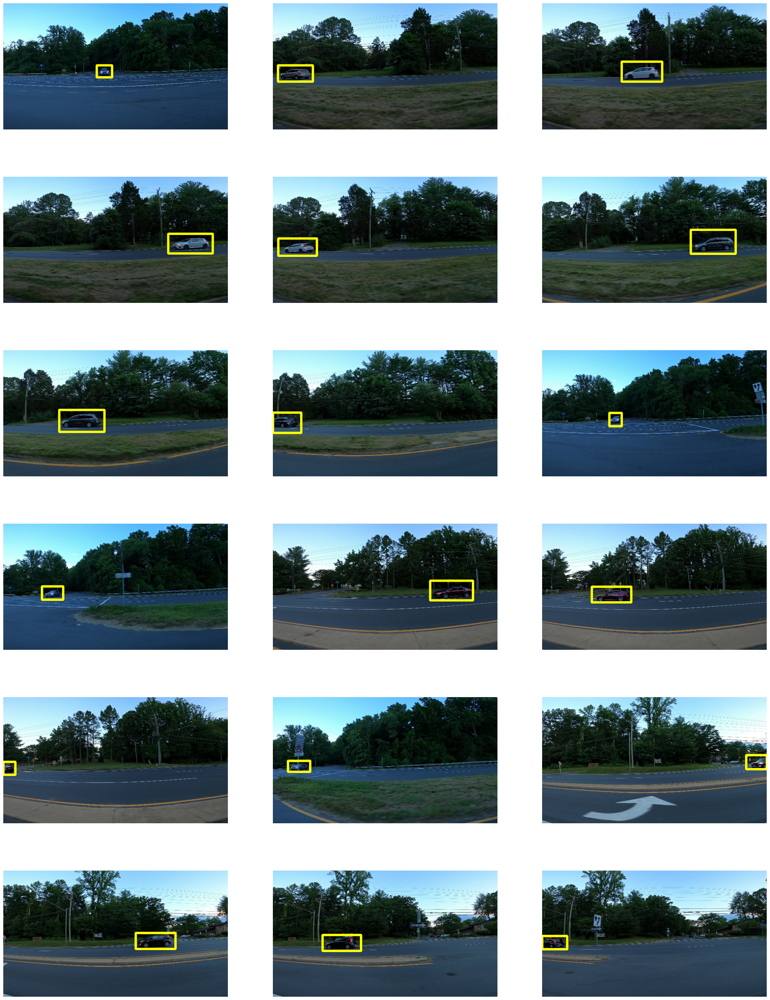

In [557]:
show_images_and_bbs(data=dataset )

In [529]:
net = cv.dnn.readNet('yolov3.weights','yolov3.cfg')

In [530]:
layers = net.getLayerNames()

In [531]:
output_layernames = net.getUnconnectedOutLayersNames()
print(output_layernames)

('yolo_82', 'yolo_94', 'yolo_106')


In [532]:
def image_to_blob(image:np.array):
    blob = cv.dnn.blobFromImage(
        image = image,
        size = (416, 416), 
        mean = (0, 0, 0), 
        swapRB=True, 
        crop=False
    )
    return blob

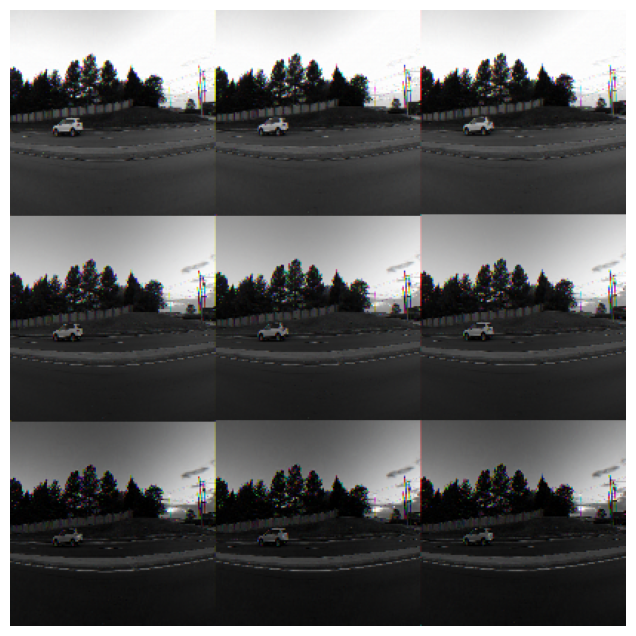

In [533]:
input_img = images_array[random.randint(0,len(images))]
blob = image_to_blob(input_img)
plt.figure(figsize=(8,8))

temp_blob = tf.reshape(tf.squeeze(blob),shape=(416,416,3))

plt.imshow(temp_blob)
plt.axis('off')
plt.show()

In [544]:

net.setInput(blob)
layerOutputs = net.forward(output_layernames)


In [545]:
def filter_output_prob(threshold_probability: float, layerOutputs):
    boxes = []
    confidences = []
    classes = []
    
    for output in layerOutputs:
        for detection in output:
            probabilites = detection[5:]
            class_id = np.argmax(probabilites)
            confidence = probabilites[class_id]
            
            if confidence > threshold_probability:
                box = detection[0:4]*np.array([IMAGE_WIDTH, IMAGE_HEIGHT,IMAGE_WIDTH, IMAGE_HEIGHT,])
                center_x, center_y, width, height = box.astype('int')
                xmin = (center_x-(width/2))
                ymin = center_y-(height/2)
                
                boxes.append([xmin,ymin,int(width),int(height)])
                confidences.append(float(confidence))
                classes.append(class_id)
                
    return boxes, confidences, classes
                

In [546]:
boxes,confidences,class_ids = filter_output_prob(PROB_THRESH,layerOutputs)

In [547]:
indicies = cv.dnn.NMSBoxes(boxes, confidences, PROB_THRESH, IoU_THRESH, top_k=5)
indicies

()

In [559]:
def draw_bounding_box(input_image:np.array, boxes, confidences:list, class_id, indices, labels=LABELS):
    image_temp = input_image.copy()
    for i in indicies:
        x, y, w, h = boxes[i]
        confidence = confidences[i]
        
        color_ = (255,255,0)
        
        c1=(int(x), int(y))
        c2=(int(x+w), int(y+h))
        
        cv.rectangle(image_temp, pt1=c1, pt2=c2, color=color_, thickness=2)
        
        text_label = '{}:{:.2f}'.format(labels[class_ids[i]], confidences[i])
        
        font_face = cv.FONT_HERSHEY_DUPLEX
        font_scale = 0.5
        font_thickness = 1
        
        cv.putText(img=image_temp,text=text_label,org=(int(x+5),int(y-10)),fontFace=font_face, fontScale=font_scale,
            color=color_, thickness=font_thickness)
        plt.imshow(image_temp)
        plt.axis('off')
        
        
        
    

In [560]:
draw_bounding_box(input_img, boxes, class_ids, confidences,indicies,LABELS)

In [561]:
def model_bbs(image , threshold_probability=0.9, iou_threshold=0.5, labels=LABELS):
    blob = image_to_blob(image)
    net.setInput(blob)
    
    output_layers = net.getUnconnectedOutLayersNames()
    outputs = net.forward(output_layers)
    
    bboxes, confidences, class_ids = filter_output_probs(threshold_probability = threshold_probability, layer_outputs = outputs)
    
    indicies = cv.dnn.NMSBoxes(bboxes = bboxes, scores = confidences, score_threshold = threshold_probability, nms_threshold = iou_threshold)
    
    draw_bounding_boxes(input_img = image, boxes = bboxes, class_ids = class_ids, confidences = confidences, labels = labels, indicies = indicies)
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


17 200 156 45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


535 183 94 26
649 120 10 15
104 203 61 17
608 130 9 13


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


235 195 86 27


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


560 187 113 45
-1 194 78 45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


504 188 123 33
394 194 90 26


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


617 189 60 34
133 193 121 39


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0 207 55 25


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


425 180 124 41
610 184 66 22


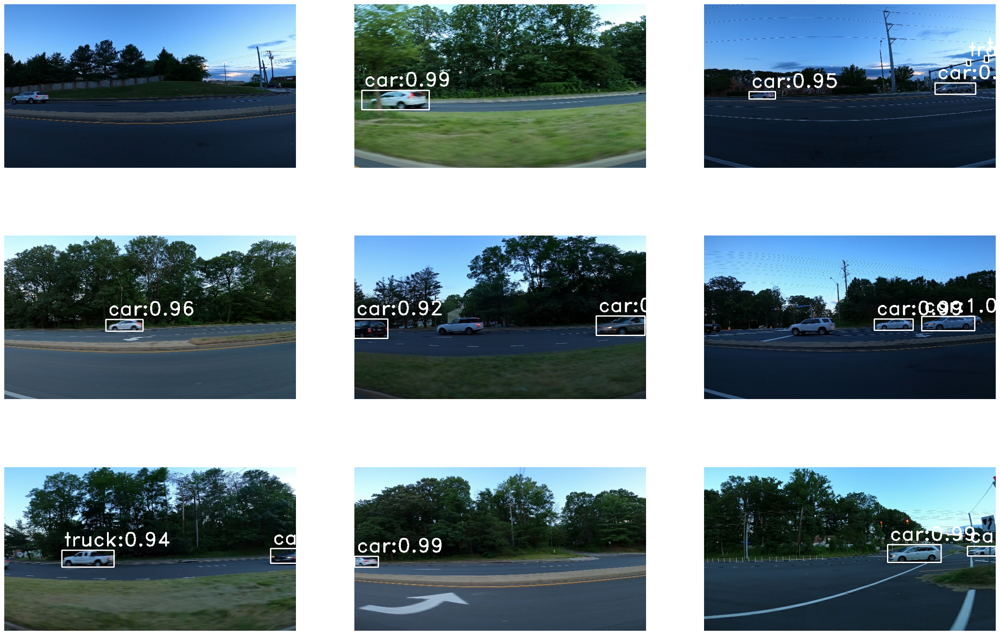

In [562]:
N_IMAGES = 9

def plot_random_images(images: np.ndarray) -> None:
    plt.figure(figsize=(30,20))
    
    for n in range(N_IMAGES):
        plt.subplot(int(np.sqrt(N_IMAGES)), int(np.sqrt(N_IMAGES)), n+1)

        image = images[np.random.randint(len(images))]
        
        model_bbs(image)
        
    # Show final plot
    plt.show()
    
# Plot images
plot_random_images(images=images_array)